In [1]:
import sys
sys.path.append("../..")

In [2]:
from artseek.data.datasets.explain_me import ExplainMeDataset
from artseek.data.datasets.artpedia import ArtpediaDataset
from PIL import Image
from transformers import AutoProcessor, CLIPModel
import torch
import lovely_tensors as lt
from tqdm import tqdm
import torch.nn.functional as F
lt.monkey_patch()

/leonardo_scratch/fast/IscrC_MOSES/nicola/miniconda3/envs/llavart/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
device = torch.device("cuda")

In [4]:
processor = AutoProcessor.from_pretrained("openai/clip-vit-base-patch32")
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
model.to(device)

CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPSdpaAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e

In [28]:
ds = ArtpediaDataset("../../data/external/artpedia", split="test")

Processing annotations:   0%|          | 0/2930 [00:00<?, ?it/s]

Processing annotations: 100%|██████████| 2930/2930 [00:00<00:00, 10193.37it/s]


In [29]:
t = torch.zeros((len(ds), 512))
t

tensor[320, 512] n=163840 (0.6Mb) all_zeros

In [10]:
# read images test1.png test2.png test3.png from directory data/images, they are not in the dataset
images = [Image.open(f"../../data/images/test{i}.png") for i in range(1, 5)]

In [30]:
for i in tqdm(range(len(ds))):
    ds_image = ds[i]["image"]
    ds_inputs = processor(images=ds_image, return_tensors="pt", padding=True).to(device)
    ds_outputs = model.get_image_features(**ds_inputs)[0]
    t[i] = ds_outputs

 27%|██▋       | 86/320 [00:12<00:44,  5.27it/s]/leonardo_scratch/fast/IscrC_MOSES/nicola/miniconda3/envs/llavart/lib/python3.12/site-packages/PIL/Image.py:3368: DecompressionBombWarning: Image size (109240236 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
100%|██████████| 320/320 [00:46<00:00,  6.81it/s]


In [31]:
inputs = processor(images=images, return_tensors="pt", padding=True).to(device)
outputs = model.get_image_features(**inputs)

In [32]:
outputs

tensor[4, 512] n=2048 (8Kb) x∈[-5.763, 2.252] μ=-0.001 σ=0.428 grad MmBackward0 cuda:0

In [33]:
t1_norm = F.normalize(outputs, p=2, dim=1)
t2_norm = F.normalize(t, p=2, dim=1)

In [34]:
cos_sim = torch.matmul(t1_norm.to(device), t2_norm.T.to(device))

# Get top 3 indices with highest similarity for each row of t1
topk_values, topk_indices = torch.topk(cos_sim, k=3, dim=1)

print("Top 3 most similar indices in t2 for each row in t1:")
print(topk_indices)

Top 3 most similar indices in t2 for each row in t1:
tensor[4, 3] i64 n=12 x∈[21, 310] μ=157.667 σ=94.754 cuda:0


In [35]:
topk_indices.v

tensor[4, 3] i64 n=12 x∈[21, 310] μ=157.667 σ=94.754 cuda:0
tensor([[ 21,  31,  38],
        [251, 256, 214],
        [167, 198, 103],
        [142, 161, 310]], device='cuda:0')

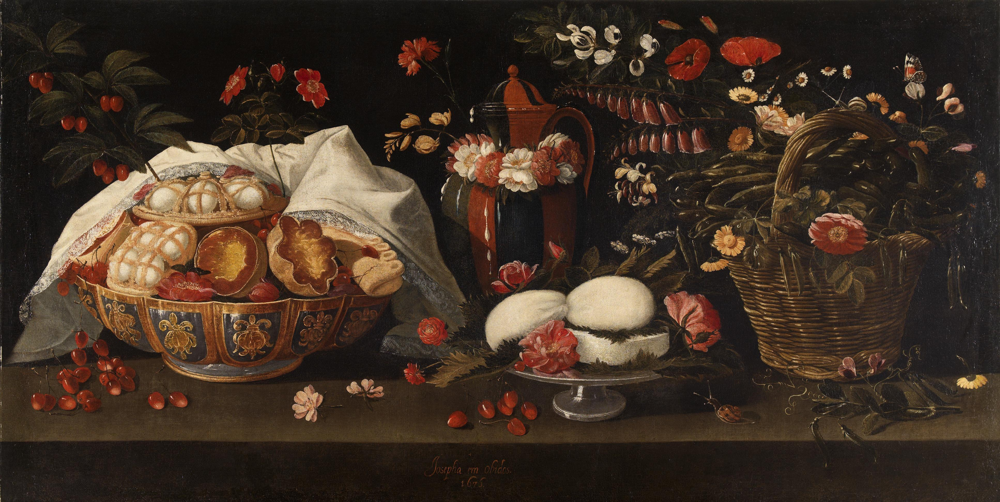

In [45]:
ds[142]["image"]